# Exploratory Data Analysis on US accidents

## Downloading data from kaggle

In [1]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"sravzongole","key":"0411b4a193337b7c5f3257f3f156db98"}'}

In [2]:
!pip install opendatasets --upgrade --quiet

In [3]:
import opendatasets as od
download_url='https://www.kaggle.com/sobhanmoosavi/us-accidents'
od.download(download_url)

  2%|▏         | 5.00M/290M [00:00<00:08, 36.2MB/s]

100%|██████████| 290M/290M [00:03<00:00, 87.3MB/s]


In [4]:
data_filename='./us-accidents/US_Accidents_Dec20_Updated.csv'

## Data preparation and cleaning
1. Load the file using pandas
2. Look at some information about the data and the columns
3. Fix any missing or incorrect values



In [5]:
import pandas as pd

In [6]:
df=pd.read_csv(data_filename)

In [7]:
# look at the entire data in the file
df

,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Number,Street,Side,City,County,State,Zipcode,Country,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,2,2019-05-21 08:29:55,2019-05-21 09:29:40,34.808868,-82.269157,34.808868,-82.269157,0.000,Accident on Tanner Rd at Pennbrooke Ln.,439.0,Tanner Rd,R,Greenville,Greenville,SC,29607-6027,US,US/Eastern,KGMU,2019-05-21 08:53:00,76.0,76.0,52.0,28.91,10.0,N,7.0,0.0,Fair,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day
1,A-2,2,2019-10-07 17:43:09,2019-10-07 19:42:50,35.090080,-80.745560,35.090080,-80.745560,0.000,Accident on Houston Branch Rd at Providence Br...,3299.0,Providence Branch Ln,R,Charlotte,Mecklenburg,NC,28270-8560,US,US/Eastern,KEQY,2019-10-07 17:53:00,76.0,76.0,62.0,29.30,10.0,VAR,3.0,0.0,Cloudy,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day
2,A-3,2,2020-12-13 21:53:00,2020-12-13 22:44:00,37.145730,-121.985052,37.165850,-121.988062,1.400,Stationary traffic on CA-17 from Summit Rd (CA...,NaN,Santa Cruz Hwy,R,Los Gatos,Santa Clara,CA,95033,US,US/Pacific,KSJC,2020-12-13 21:53:00,51.0,51.0,80.0,30.17,10.0,W,6.0,0.0,Fair,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night
3,A-4,2,2018-04-17 16:51:23,2018-04-17 17:50:46,39.110390,-119.773781,39.110390,-119.773781,0.000,Accident on US-395 Southbound at Topsy Ln.,NaN,US Highway 395 S,R,Carson City,Douglas,NV,89705,US,US/Pacific,KCXP,2018-04-17 16:55:00,53.6,NaN,16.0,30.16,10.0,SSW,4.6,NaN,Clear,False,False,False,False,False,False,False,False,False,False,False,True,False,Day,Day,Day,Day
4,A-5,3,2016-08-31 17:40:49,2016-08-31 18:10:49,26.102942,-80.265091,26.102942,-80.265091,0.000,Accident on I-595 Westbound at Exit 4 / Pine I...,NaN,I-595 W,R,Fort Lauderdale,Broward,FL,33324,US,US/Eastern,KHWO,2016-08-31 17:53:00,84.2,NaN,84.0,29.92,10.0,SSE,13.8,NaN,Overcast,False,False,False,False,True,False,False,False,False,False,False,True,False,Day,Day,Day,Day
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2906605,A-2906606,2,2018-06-28 08:49:01,2018-06-28 09:18:51,29.813824,-95.399437,29.813824,-95.399437,0.000,Accident on 30th St at Yale St.,3001.0,Yale St,L,Houston,Harris,TX,77018-8433,US,US/Central,KMCJ,2018-06-28 08:35:00,84.2,NaN,70.0,30.02,9.0,Variable,5.8,NaN,Clear,False,False,False,False,False,False,False,False,False,True,False,False,False,Day,Day,Day,Day
2906606,A-2906607,2,2019-01-10 02:01:01,2019-01-10 02:30:32,34.068890,-117.342010,34.068890,-117.342010,0.000,At Valley Blvd - Accident.,NaN,Cypress Ave,R,Colton,San Bernardino,CA,92324,US,US/Pacific,KSBD,2019-01-10 02:00:00,46.9,NaN,74.0,30.14,10.0,Calm,NaN,NaN,Clear,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night
2906607,A-2906608,2,2020-11-23 12:52:00,2020-11-24 00:47:37,25.702200,-80.335556,25.703040,-80.334099,0.108,Stationary traffic on County Hwy-913 - FL-986 ...,8798.0,SW 72nd St,L,Miami,Miami-Dade,FL,33173-3512,US,US/Eastern,KTMB,2020-11-23 12:53:00,76.0,76.0,85.0,30.00,10.0,NNW,16.0,0.0,Mostly Cloudy,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day
2906608,A-2906609,2,2019-12-29 22:38:00,2019-12-29 23:38:00,40.660140,-111.952460,40.660140,-111.952460,0.000,At UT-266/4700/Exit 15 - Accident.,NaN,I-215 N,R,Salt Lake City,Salt Lake,UT,84129,US,US/Mountain,KU42,2019-12-29 22:54:00,27.0,19.0,81.0,25.81,10.0,SSE,8.0,0.0,Cloudy,False,F

In [8]:
#look at collected information type on US accidents in each record i.e. column information
df.columns

Index(['ID', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat', 'Start_Lng',
       'End_Lat', 'End_Lng', 'Distance(mi)', 'Description', 'Number', 'Street',
       'Side', 'City', 'County', 'State', 'Zipcode', 'Country', 'Timezone',
       'Airport_Code', 'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction',
       'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition', 'Amenity',
       'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway',
       'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
       'Turning_Loop', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight'],
      dtype='object')

In [9]:
# finding number of columns in the dataframe
len(df.columns)


47

In [10]:
#finding number of rows in the dataframe
len(df)

2906610

In [11]:
#Information of the dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2906610 entries, 0 to 2906609
Data columns (total 47 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   ID                     object 
 1   Severity               int64  
 2   Start_Time             object 
 3   End_Time               object 
 4   Start_Lat              float64
 5   Start_Lng              float64
 6   End_Lat                float64
 7   End_Lng                float64
 8   Distance(mi)           float64
 9   Description            object 
 10  Number                 float64
 11  Street                 object 
 12  Side                   object 
 13  City                   object 
 14  County                 object 
 15  State                  object 
 16  Zipcode                object 
 17  Country                object 
 18  Timezone               object 
 19  Airport_Code           object 
 20  Weather_Timestamp      object 
 21  Temperature(F)         float64
 22  Wind_Chill(F)     

In [12]:
df.describe()
#Descriptive statistics

,Severity,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Number,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in)
count,2.906610e+06,2.906610e+06,2.906610e+06,2.623789e+06,2.623789e+06,2.906610e+06,1.014938e+06,2.839386e+06,1.722751e+06,2.835340e+06,2.849702e+06,2.834532e+06,2.599447e+06,1.605284e+06
mean,2.288649e+00,3.653027e+01,-9.642676e+01,3.651733e+01,-9.620367e+01,3.980541e-01,6.789728e+03,6.098873e+01,5.499048e+01,6.537758e+01,2.965685e+01,9.116766e+00,7.818111e+00,1.119459e-02
std,5.541618e-01,5.013964e+00,1.775412e+01,5.016609e+00,1.765971e+01,1.592556e+00,1.697225e+04,1.845258e+01,2.219542e+01,2.287854e+01,9.094133e-01,2.837271e+00,5.431171e+00,1.540812e-01
min,1.000000e+00,2.455527e+01,-1.246238e+02,2.455527e+01,-1.246238e+02,0.000000e+00,0.000000e+00,-8.900000e+01,-8.900000e+01,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.000000e+00,3.366453e+01,-1.178232e+02,3.364659e+01,-1.177020e+02,0.000000e+00,9.650000e+02,4.890000e+01,3.900000e+01,4.900000e+01,2.959000e+01,1.000000e+01,4.600000e+00,0.000000e+00
50%,2.000000e+00,3.609977e+01,-9.116690e+01,3.605898e+01,-9.105163e+01,0.000000e+00,3.093000e+03,6.300000e+01,5.800000e+01,6.800000e+01,2.992000e+01,1.000000e+01,7.000000e+00,0.000000e+00
75%,3.000000e+00,4.037505e+01,-8.085814e+01,4.033133e+01,-8.084679e+01,2.790000e-01,7.976000e+03,7.500000e+01,7.200000e+01,8.500000e+01,3.007000e+01,1.000000e+01,1.040000e+01,0.000000e+00
max,4.000000e+00,4.900220e+01,-6.711317e+01,4.907500e+01,-6.710924e+01,3.336300e+02,9.999997e+06,2.030000e+02,1.740000e+02,1.000000e+02,5.804000e+01,1.400000e+02,9.840000e+02,2.400000e+01


### Queries
1. Are there more accidents in warmer or colder areas?
2. which 5 states have highest number of accidents?
   How about accidents per capita?
3. Does newyork showup in the data? If yes, then why
   is the count lower in the most populous city? 
4. Among the top 100 cities in number of 
   accidents, which states do they belong to most 
  frequently?



In [13]:
numerics=['int16','int32','int64','float16','float32','float64']
numeric_df = df.select_dtypes(include=numerics)
len(numeric_df.columns)

14

## Finding missing values

In [14]:
df.isna()
# returns true if it is null or false if data exists

,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Number,Street,Side,City,County,State,Zipcode,Country,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2906605,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2906606,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2906607,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2906608,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [15]:
#finding count of missing values
df.isna().sum()

ID                             0
Severity                       0
Start_Time                     0
End_Time                       0
Start_Lat                      0
Start_Lng                      0
End_Lat                   282821
End_Lng                   282821
Distance(mi)                   0
Description                    0
Number                   1891672
Street                         0
Side                           0
City                         108
County                         0
State                          0
Zipcode                     1114
Country                        0
Timezone                    3430
Airport_Code                6608
Weather_Timestamp          46917
Temperature(F)             67224
Wind_Chill(F)            1183859
Humidity(%)                71270
Pressure(in)               56908
Visibility(mi)             72078
Wind_Direction             63474
Wind_Speed(mph)           307163
Precipitation(in)        1301326
Weather_Condition          71851
Amenity   

In [16]:
#percentage of missing values per column
df.isna().sum().sort_values(ascending=False)

Number                   1891672
Precipitation(in)        1301326
Wind_Chill(F)            1183859
Wind_Speed(mph)           307163
End_Lat                   282821
End_Lng                   282821
Visibility(mi)             72078
Weather_Condition          71851
Humidity(%)                71270
Temperature(F)             67224
Wind_Direction             63474
Pressure(in)               56908
Weather_Timestamp          46917
Airport_Code                6608
Timezone                    3430
Zipcode                     1114
Nautical_Twilight            110
Astronomical_Twilight        110
Civil_Twilight               110
Sunrise_Sunset               110
City                         108
Amenity                        0
Severity                       0
Start_Time                     0
End_Time                       0
Start_Lat                      0
Start_Lng                      0
Distance(mi)                   0
Description                    0
Turning_Loop                   0
Street    

In [17]:
missing_percentages=df.isna().sum().sort_values(ascending=False)/len(df)
missing_percentages

Number                   0.650817
Precipitation(in)        0.447713
Wind_Chill(F)            0.407299
Wind_Speed(mph)          0.105677
End_Lat                  0.097303
End_Lng                  0.097303
Visibility(mi)           0.024798
Weather_Condition        0.024720
Humidity(%)              0.024520
Temperature(F)           0.023128
Wind_Direction           0.021838
Pressure(in)             0.019579
Weather_Timestamp        0.016141
Airport_Code             0.002273
Timezone                 0.001180
Zipcode                  0.000383
Nautical_Twilight        0.000038
Astronomical_Twilight    0.000038
Civil_Twilight           0.000038
Sunrise_Sunset           0.000038
City                     0.000037
Amenity                  0.000000
Severity                 0.000000
Start_Time               0.000000
End_Time                 0.000000
Start_Lat                0.000000
Start_Lng                0.000000
Distance(mi)             0.000000
Description              0.000000
Turning_Loop  

In [18]:
missing_percentages[missing_percentages!=0]

Number                   0.650817
Precipitation(in)        0.447713
Wind_Chill(F)            0.407299
Wind_Speed(mph)          0.105677
End_Lat                  0.097303
End_Lng                  0.097303
Visibility(mi)           0.024798
Weather_Condition        0.024720
Humidity(%)              0.024520
Temperature(F)           0.023128
Wind_Direction           0.021838
Pressure(in)             0.019579
Weather_Timestamp        0.016141
Airport_Code             0.002273
Timezone                 0.001180
Zipcode                  0.000383
Nautical_Twilight        0.000038
Astronomical_Twilight    0.000038
Civil_Twilight           0.000038
Sunrise_Sunset           0.000038
City                     0.000037
dtype: float64

In [19]:
# pandas series removes zeroes
type(missing_percentages)

pandas.core.series.Series

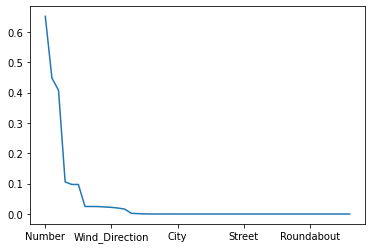

In [20]:
missing_percentages.plot()

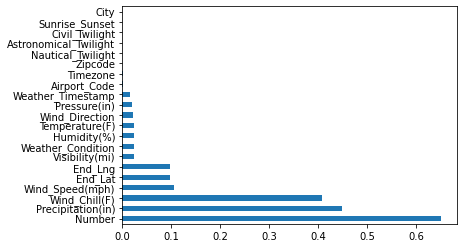

In [21]:
missing_percentages[missing_percentages!=0].plot(kind='barh')

##Remove columns that you don't want to use

In [22]:
df.columns

Index(['ID', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat', 'Start_Lng',
       'End_Lat', 'End_Lng', 'Distance(mi)', 'Description', 'Number', 'Street',
       'Side', 'City', 'County', 'State', 'Zipcode', 'Country', 'Timezone',
       'Airport_Code', 'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction',
       'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition', 'Amenity',
       'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway',
       'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
       'Turning_Loop', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight'],
      dtype='object')

## Exploratory data analysis and visualization
columns we will analyze
1. city and state
2. start time
3. start lat, start lng
4. Temperature
5. weather condition


## 1.Analyzing City column

In [24]:
cities=df.City.unique()
len(cities)

11790

In [25]:
cities[:100]

array(['Greenville', 'Charlotte', 'Los Gatos', 'Carson City',
       'Fort Lauderdale', 'Rifle', 'Whittier', 'Franklin', 'Valencia',
       'Dover', 'Yonkers', 'Garland', 'Tucson', 'Oakland', 'Houston',
       'Los Angeles', 'Fontana', 'Saint Clair Shores',
       'Hopewell Junction', 'Atlanta', 'Fuquay Varina', 'Daleville',
       'Martinez', 'North Charleston', 'Austin', 'Seal Beach',
       'Cedar Springs', 'Miami', 'Corfu', 'Indianapolis', 'Baton Rouge',
       'Grand Terrace', 'Providence Forge', 'Tempe', 'Pittsford',
       'Pittsburgh', 'Sacramento', 'Latham', 'Homosassa', 'Fort Worth',
       'Redding', 'Downey', 'Minneapolis', 'Lake Worth', 'Grand Rapids',
       'Aldrich', 'Richmond', 'North Highlands', 'Dublin', 'Stafford',
       'Doswell', 'Flint', 'Ballston Spa', 'Baldwin Park',
       'Monroe Township', 'Dallas', 'El Paso', 'Jacksonville',
       'Moreno Valley', 'Summerfield', 'Phoenix', 'San Diego',
       'Capitol Heights', 'East Hartford', 'Lafayette', 'Calpine',
   

In [28]:
cities_by_accident=df.City.value_counts()
cities_by_accident

Los Angeles     68411
Houston         68265
Charlotte       56176
Miami           49965
Dallas          48525
                ...  
Grenora             1
Sheppard AFB        1
Battlefield         1
Vona                1
Ebeemee Twp         1
Name: City, Length: 11789, dtype: int64

In [31]:
cities_by_accident[:30]

Los Angeles      68411
Houston          68265
Charlotte        56176
Miami            49965
Dallas           48525
Austin           38808
Raleigh          31355
Atlanta          29244
Sacramento       28984
Orlando          28092
Nashville        25277
Baton Rouge      25080
Minneapolis      22469
San Diego        22329
Phoenix          21370
Oklahoma City    21292
Portland         19432
Richmond         18343
Seattle          17384
Saint Paul       17266
San Jose         16744
Chicago          16571
Jacksonville     16210
San Antonio      15751
Denver           14272
Indianapolis     13671
Tucson           13526
Columbia         13326
Greenville       12925
Riverside        12359
Name: City, dtype: int64

In [38]:
#check if newyork data is available or not in the data
'New York' in df.City

False

In [39]:
'NY' in df.State

False

### Insight 1.1:
We do not have information on newyork which is most populous country
(Always look at external data to validate our finding)

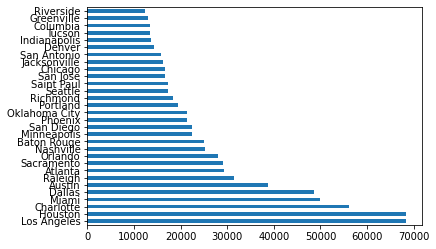

In [44]:
cities_by_accident[:30].plot(kind='barh')

In [46]:
!pip install seaborn

In [48]:
import seaborn as sns
sns.set_style("darkgrid")

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


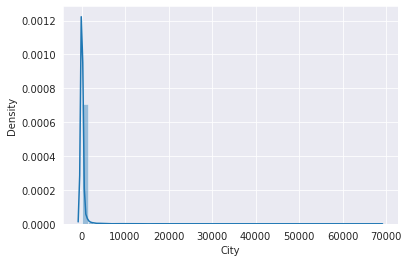

In [50]:
sns.distplot(cities_by_accident)

In [52]:
high_accident_cities=cities_by_accident[cities_by_accident>=1000]
low_accident_cities=cities_by_accident[cities_by_accident<=1000]

In [53]:
len(high_accident_cities)

513

In [54]:
len(low_accident_cities)

11276

In [57]:
len(high_accident_cities)/len(cities)

0.04351145038167939

### Insight 1.2:
less than 5% cities have more than 1000 yearly accidents

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


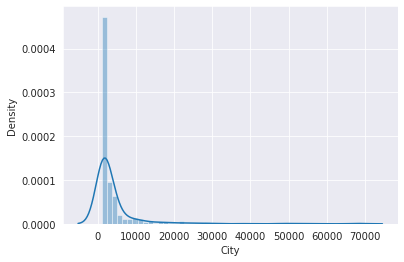

In [58]:
#plot thes high accident cities for better understanding
sns.distplot(high_accident_cities)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


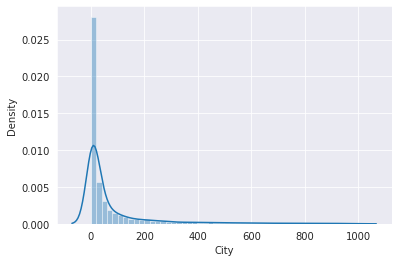

In [59]:
sns.distplot(low_accident_cities)

### Insight 1.3:
Number of accidents per city decrease exponentially

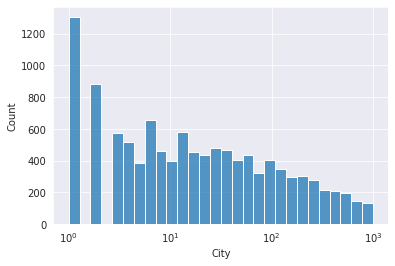

In [61]:
sns.histplot(low_accident_cities,log_scale=True)

In [63]:
cities_by_accident[cities_by_accident==1]

Greenwood Lake    1
Selby             1
Munroe Falls      1
Mohall            1
Coulee Dam        1
                 ..
Grenora           1
Sheppard AFB      1
Battlefield       1
Vona              1
Ebeemee Twp       1
Name: City, Length: 1306, dtype: int64

In [64]:
cities_by_accident[cities_by_accident==2]

Dewy Rose        2
Sublette         2
Fishertown       2
Left Hand        2
Spiritwood       2
                ..
Kadoka           2
Brackettville    2
Baggs            2
Waukon           2
Redkey           2
Name: City, Length: 881, dtype: int64

### Insight 1.4:
over 1300 cities have reported just 1 accident per year
(need to investigate) coz the data is of information on 4 years

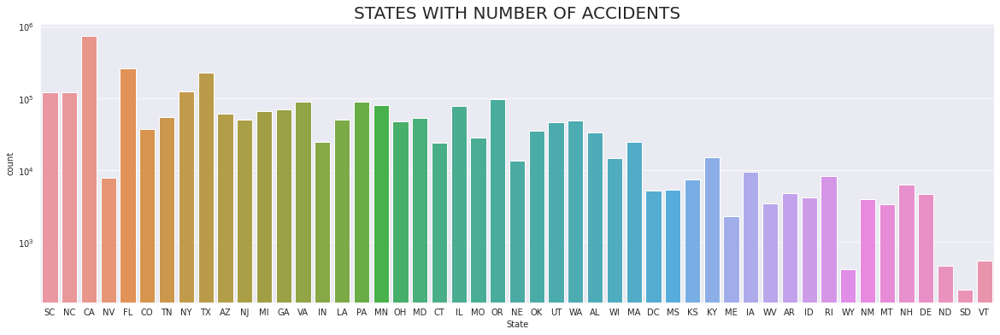

In [221]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20,6))
sns.countplot(x="State",data=df)
plt.yscale("log")
plt.title("STATES WITH NUMBER OF ACCIDENTS",fontsize=20)
plt.show()

In [239]:
top_cities=df.City.value_counts().sort_values()[-10:]
top_cities.columns=["city","number_of_accidents"]
top_cities


Orlando        28092
Sacramento     28984
Atlanta        29244
Raleigh        31355
Austin         38808
Dallas         48525
Miami          49965
Charlotte      56176
Houston        68265
Los Angeles    68411
Name: City, dtype: int64

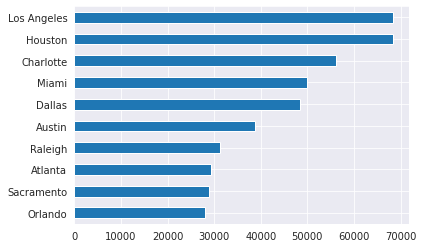

In [240]:
top_cities.plot(kind='barh')

### Insight 1.5:
- Maximum accidents occured in California,Florida,Texas states
- Highest number of accidents occured in Los Angeles and Houston cities

## 2.Analyzing start time column
(to identify at what time major accidents happened-is it in the morning or in the afternoon; day vs nights etc)

In [65]:
df.columns

Index(['ID', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat', 'Start_Lng',
       'End_Lat', 'End_Lng', 'Distance(mi)', 'Description', 'Number', 'Street',
       'Side', 'City', 'County', 'State', 'Zipcode', 'Country', 'Timezone',
       'Airport_Code', 'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction',
       'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition', 'Amenity',
       'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway',
       'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
       'Turning_Loop', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight'],
      dtype='object')

In [66]:
df.Start_Time

0          2019-05-21 08:29:55
1          2019-10-07 17:43:09
2          2020-12-13 21:53:00
3          2018-04-17 16:51:23
4          2016-08-31 17:40:49
                  ...         
2906605    2018-06-28 08:49:01
2906606    2019-01-10 02:01:01
2906607    2020-11-23 12:52:00
2906608    2019-12-29 22:38:00
2906609    2018-03-26 13:35:03
Name: Start_Time, Length: 2906610, dtype: object

In [67]:
#coverting object datatype to datetime for Start_Time
pd.to_datetime(df.Start_Time)

0         2019-05-21 08:29:55
1         2019-10-07 17:43:09
2         2020-12-13 21:53:00
3         2018-04-17 16:51:23
4         2016-08-31 17:40:49
                  ...        
2906605   2018-06-28 08:49:01
2906606   2019-01-10 02:01:01
2906607   2020-11-23 12:52:00
2906608   2019-12-29 22:38:00
2906609   2018-03-26 13:35:03
Name: Start_Time, Length: 2906610, dtype: datetime64[ns]

In [69]:
#let's overwrite column in dataframe to timestamp
df.Start_Time=pd.to_datetime(df.Start_Time)
df.Start_Time[0]

Timestamp('2019-05-21 08:29:55')

### Queries
1. what time of the day are accidents mostly    
   frequently occuring? (answered)
2. Which days of the week have most accidents? (answered)
3. Which months have most accidents? (answered)
4. What is trend of accidents year over year?
   (Decreasing/increasing)
5. Data particularly where you live in and identify if 
   this information changes from state to state if you stay in US?
6. When is the accidents per unit of traffic highest?   


Each accident occur at different time stamp so will will group the data and analyze the frequency of accidents in different timeperiod

In [71]:
df.Start_Time[0].hour

8

In [73]:
df.Start_Time.dt.hour

0           8
1          17
2          21
3          16
4          17
           ..
2906605     8
2906606     2
2906607    12
2906608    22
2906609    13
Name: Start_Time, Length: 2906610, dtype: int64

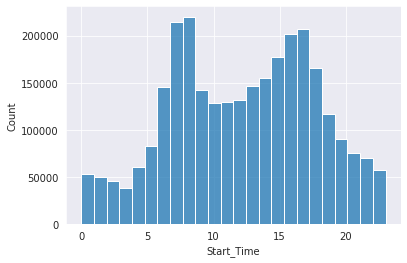

In [75]:
sns.histplot(df.Start_Time.dt.hour,bins=24)

It's easy to understand the plot with percentages


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


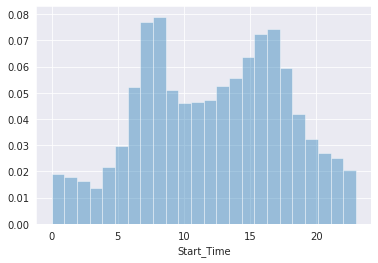

In [79]:
sns.distplot(df.Start_Time.dt.hour,bins=24,kde=False,norm_hist=True)

### Insight 2.1:
- High percentage of accidents occured between 6 AM-10 AM (Most of the employees will be in hurry during this time to get to work i.e. traffic might be high causing higher accidents)
- Next highest percentage is between 3PM to 6PM


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


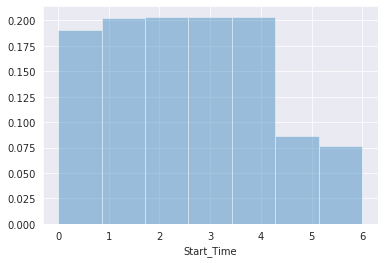

In [82]:
sns.distplot(df.Start_Time.dt.dayofweek,bins=7,kde=False,norm_hist=True)

### Insight 2.2:
- Usually in week days, occurance of accidents are high, on weekends number of accidents are lower because 
- check if distribution of accidents by hour same in weekends as on weekdays

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


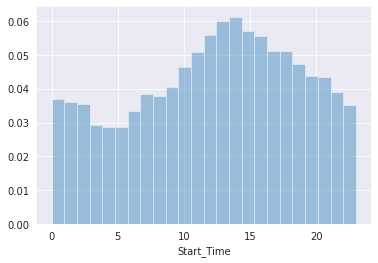

In [91]:
weekends_start_time=df.Start_Time[df.Start_Time.dt.dayofweek>=5 ]
sns.distplot(weekends_start_time.dt.hour,bins=24,kde=False,norm_hist=True)


### Insight 2.3:
On weekends, it's in the afternoon that most accidents occured

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


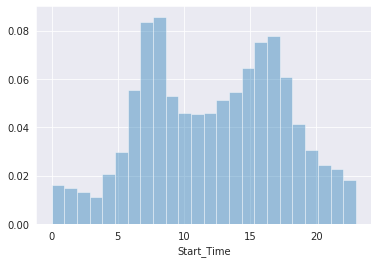

In [92]:
# let's check the trend for different days
weekdays_start_time=df.Start_Time[df.Start_Time.dt.dayofweek<5 ]
sns.distplot(weekdays_start_time.dt.hour,bins=24,kde=False,norm_hist=True)

### Insight 2.4:
- There is a different trend in data on weekdays and weekends on occurance of accidents as the peak occurs between 10AM and 3PM unlike weekdays
- coming to weekdays, peak occurs in the morning from 6 AM to 10AM and in the afternoon from 3PM to 6PM


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


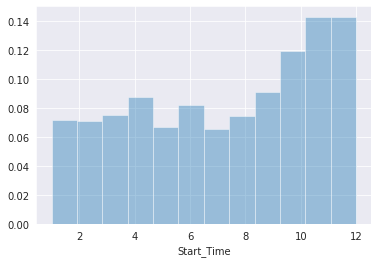

In [93]:
mondays_start_time=df.Start_Time[df.Start_Time.dt.dayofweek==0 ]
sns.distplot(mondays_start_time.dt.month,bins=12,kde=False,norm_hist=True)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


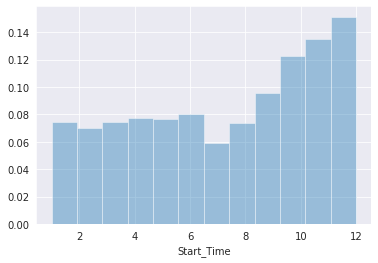

In [94]:
sns.distplot(df.Start_Time.dt.month,bins=12,kde=False,norm_hist=True)

### Insight 2.5:
- There is a increase in trend from January to December but when you check the data, information of Jan 2016 is missing due to which decrease in accidents in January(i.e. may be estimating 20% higher actually)
- Frequency of accidents occuring in winter than in summer 

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


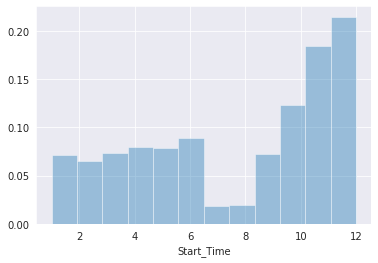

In [98]:
df_2020=df.Start_Time[df.Start_Time.dt.year ==2020]
sns.distplot(df_2020.dt.month,bins=12,kde=False,norm_hist=True)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


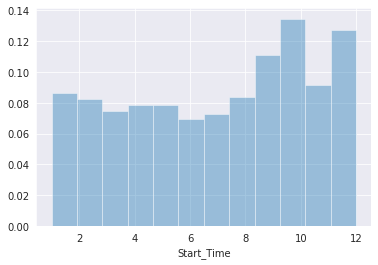

In [96]:
df_2019=df.Start_Time[df.Start_Time.dt.year ==2019]
sns.distplot(df_2019.dt.month,bins=12,kde=False,norm_hist=True)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


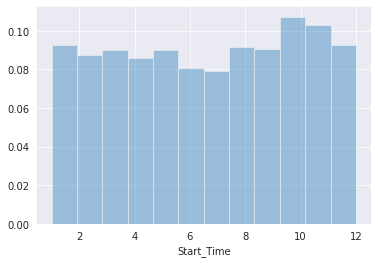

In [97]:
df_2018=df.Start_Time[df.Start_Time.dt.year ==2018]
sns.distplot(df_2018.dt.month,bins=12,kde=False,norm_hist=True)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


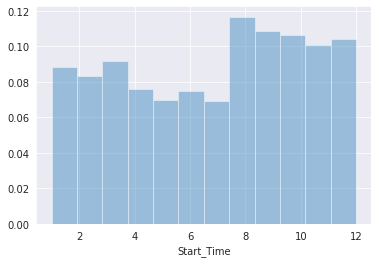

In [99]:
df_2017=df.Start_Time[df.Start_Time.dt.year ==2017]
sns.distplot(df_2017.dt.month,bins=12,kde=False,norm_hist=True)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


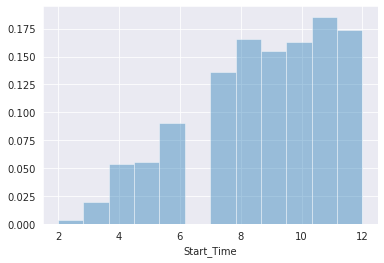

In [100]:
df_2016=df.Start_Time[df.Start_Time.dt.year ==2016]
sns.distplot(df_2016.dt.month,bins=12,kde=False,norm_hist=True)

### Insight 2.6:
- In 2017,2018 and 2019, data distribution is balanced
- In 2020, number of accidents are low due to coronavirus pandemic
- In 2016, much data is missing for 2016 as distribution is abnormal(may be because of start of data collection in 2016 itself)
- (Look at the source of data.If we have information then identify the issue on the abnormalities in data distribution)

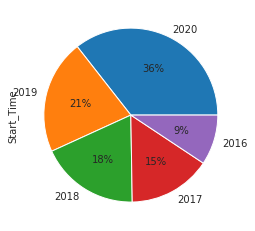

In [106]:
df.Start_Time.dt.year.value_counts().plot(kind='pie',autopct='%1.0f%%')

## 3.Analyze Start latitude and start longitude

In [107]:
df.Start_Lat, df.Start_Lng

(0          34.808868
 1          35.090080
 2          37.145730
 3          39.110390
 4          26.102942
              ...    
 2906605    29.813824
 2906606    34.068890
 2906607    25.702200
 2906608    40.660140
 2906609    38.831749
 Name: Start_Lat, Length: 2906610, dtype: float64, 0          -82.269157
 1          -80.745560
 2         -121.985052
 3         -119.773781
 4          -80.265091
               ...    
 2906605    -95.399437
 2906606   -117.342010
 2906607    -80.335556
 2906608   -111.952460
 2906609   -104.748161
 Name: Start_Lng, Length: 2906610, dtype: float64)

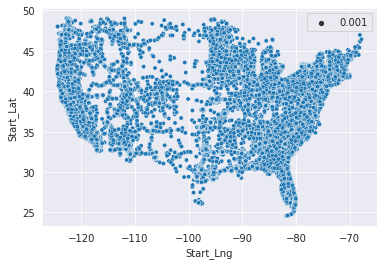

In [112]:
df_sample=df.sample(int(0.1*len(df)))
sns.scatterplot(x=df_sample.Start_Lng,y=df_sample.Start_Lat,size=0.001)

In [113]:
# let's plot this in map
import folium

In [114]:
folium.Map()

In [117]:
map=folium.Map()
marker=folium.Marker((df.Start_Lat[0],df.Start_Lng[0]))
marker.add_to(map)
map

In [125]:
list(zip(list(df_sample.Start_Lat),list(df_sample.Start_Lng)))

[(44.967468, -93.223557),
 (35.3352, -80.82500999999998),
 (38.08052, -122.54452),
 (45.23246, -123.15839),
 (34.020972, -118.277818),
 (33.065525, -96.824669),
 (33.59396, -81.940552),
 (32.72925, -117.10681),
 (47.18106, -122.46507),
 (36.09378, -109.6249),
 (45.53292800000001, -117.920654),
 (46.95506500000001, -112.689655),
 (37.648998, -77.56055500000002),
 (32.850479, -96.569969),
 (41.86597, -87.64442),
 (26.61341, -80.068784),
 (34.199014, -118.337797),
 (39.155303, -84.54454100000002),
 (34.071644, -118.109261),
 (33.862797, -118.043495),
 (46.23506, -123.87196000000002),
 (32.709740000000004, -117.11953),
 (34.784073, -82.40479300000001),
 (33.32003, -111.911156),
 (32.77956, -97.06116),
 (29.67485, -95.355812),
 (45.003244, -93.213994),
 (37.78743, -122.38939),
 (33.261604, -111.881027),
 (37.541225, -122.366646),
 (32.930440000000004, -96.75804),
 (33.090794, -117.081054),
 (35.835079, -78.582458),
 (34.106239, -117.532013),
 (38.59371, -121.5044),
 (41.095577, -73.936325),

In [127]:
# based on density of points show heat map 
from folium.plugins import HeatMap
map1= folium.Map()
HeatMap(zip(list(df_sample.Start_Lat),list(df_sample.Start_Lng))).add_to(map1)
map1


### Insight 3.1:
- Most of the accidents occuring in coastal areas based on the heatmap

### 4.Analyzing Temperature parameter for US accidents

In [130]:
df.columns

Index(['ID', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat', 'Start_Lng',
       'End_Lat', 'End_Lng', 'Distance(mi)', 'Description', 'Number', 'Street',
       'Side', 'City', 'County', 'State', 'Zipcode', 'Country', 'Timezone',
       'Airport_Code', 'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction',
       'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition', 'Amenity',
       'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway',
       'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
       'Turning_Loop', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight'],
      dtype='object')

In [134]:
df['Temperature(F)']

0          76.0
1          76.0
2          51.0
3          53.6
4          84.2
           ... 
2906605    84.2
2906606    46.9
2906607    76.0
2906608    27.0
2906609    51.1
Name: Temperature(F), Length: 2906610, dtype: float64

In [136]:
df['Temperature(F)'].describe()

count    2.839386e+06
mean     6.098873e+01
std      1.845258e+01
min     -8.900000e+01
25%      4.890000e+01
50%      6.300000e+01
75%      7.500000e+01
max      2.030000e+02
Name: Temperature(F), dtype: float64

In [142]:
df['Temperature(F)'].isna().sum()/len(df)

0.023127973825177783

In [ ]:
#Since more than 98% of the data on Temperature is available, we shall analyze temperature parameter

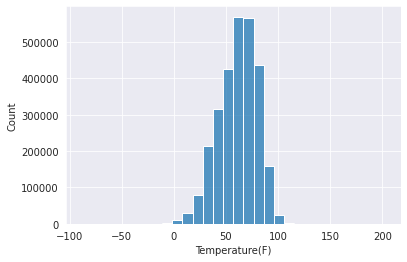

In [147]:
#df['Temperature(F)'].dt.value_counts().plot(kind='pie',autopct='%1.0f%%')
sns.histplot(df['Temperature(F)'],bins=30)

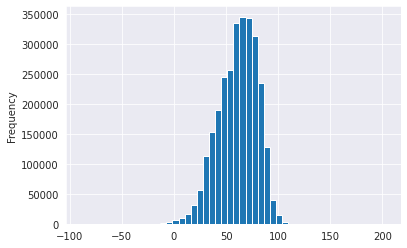

In [157]:
df['Temperature(F)'].plot(kind='hist',bins=50)

### Insight 4.1:
- Majority of accidents occured between 35'F to 75'F but we cannot say that temperature is affecting the accident occurance as at very low temperatures(below35) as well as at very high temperatures(above 75) accidents are low.(This is because at very low temperatures or at very high temperatures there might be no movement of vehicles much due to safety precautions taken by people generally)

## 5.Analyzing Weather conditions

In [158]:
df.columns

Index(['ID', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat', 'Start_Lng',
       'End_Lat', 'End_Lng', 'Distance(mi)', 'Description', 'Number', 'Street',
       'Side', 'City', 'County', 'State', 'Zipcode', 'Country', 'Timezone',
       'Airport_Code', 'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction',
       'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition', 'Amenity',
       'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway',
       'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
       'Turning_Loop', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight'],
      dtype='object')

In [169]:
len(df.Weather_Condition.unique())

129

In [170]:
df.Weather_Condition.value_counts()

Fair                         692680
Clear                        498925
Mostly Cloudy                386122
Partly Cloudy                268851
Cloudy                       245054
                              ...  
Sleet / Windy                     1
Heavy Smoke                       1
Dust Whirls                       1
Sand / Dust Whirls Nearby         1
Heavy Rain Showers                1
Name: Weather_Condition, Length: 128, dtype: int64

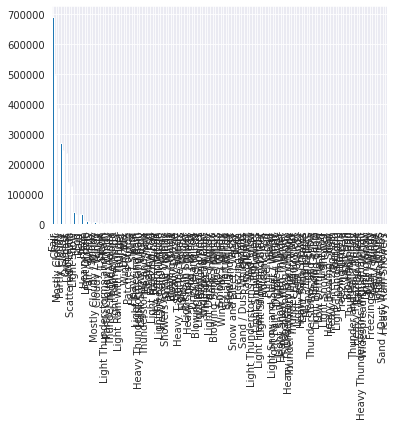

In [173]:
df.Weather_Condition.value_counts().plot(kind='bar')

In [179]:
df.Weather_Condition.value_counts().sort_values(ascending=False)[:40]

Fair                            692680
Clear                           498925
Mostly Cloudy                   386122
Partly Cloudy                   268851
Cloudy                          245054
Overcast                        237068
Light Rain                      140946
Scattered Clouds                127090
Light Snow                       39941
Fog                              33424
Rain                             33383
Haze                             32993
Heavy Rain                       12340
Light Drizzle                     9484
Fair / Windy                      9121
Smoke                             6037
Mostly Cloudy / Windy             5100
Cloudy / Windy                    4773
Snow                              4589
T-Storm                           3313
Light Thunderstorms and Rain      3089
Partly Cloudy / Windy             3054
Thunder in the Vicinity           2829
Thunderstorm                      2801
Light Rain / Windy                2653
Light Rain with Thunder  

In [180]:
df[["Weather_Condition","Severity"]].value_counts().sort_values()[-10:]

Weather_Condition  Severity
Fair               3            87216
Mostly Cloudy      3            92032
Light Rain         2            99072
Clear              3           139753
Overcast           2           154204
Partly Cloudy      2           194277
Cloudy             2           196458
Mostly Cloudy      2           274760
Clear              2           332781
Fair               2           570624
dtype: int64

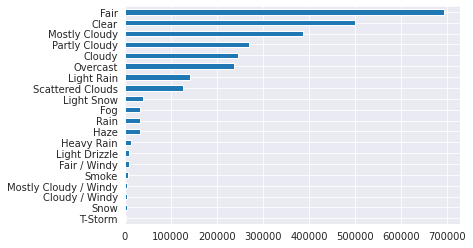

In [184]:
df["Weather_Condition"].value_counts().sort_values()[-20:].plot(kind='barh')

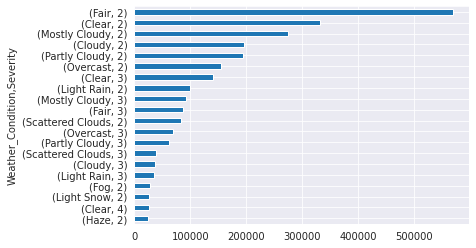

In [185]:
#let's look at the severity of the accidents at different weather conditions
df[["Weather_Condition","Severity"]].value_counts().sort_values()[-20:].plot(kind='barh')

### Insight 5.1:
- Majority of accidents occured in Fair, Clear and cloudy conditions(let's understand the severity of accidents with weather conditions)


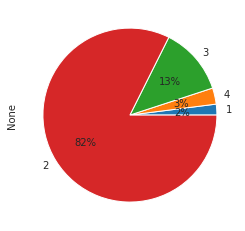

In [193]:
#df[["Weather_Condition","Severity"]].value_counts().sort_values()['Fair'].subplot(kind='bar')
df[["Weather_Condition","Severity"]].value_counts().sort_values()['Fair'].plot(kind='pie',autopct='%1.0f%%')

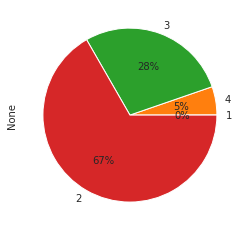

In [194]:
#df[["Weather_Condition","Severity"]].value_counts().sort_values()['Clear'].subplot(kind='bar')
df[["Weather_Condition","Severity"]].value_counts().sort_values()['Clear'].plot(kind='pie',autopct='%1.0f%%')

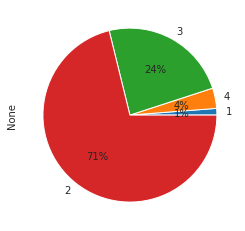

In [196]:
#df[["Weather_Condition","Severity"]].value_counts().sort_values()['Mostly Cloudy'].subplot(kind='bar')
df[["Weather_Condition","Severity"]].value_counts().sort_values()['Mostly Cloudy'].plot(kind='pie',autopct='%1.0f%%')

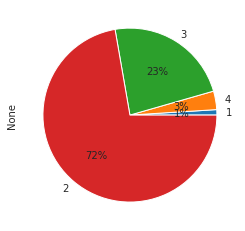

In [200]:
#df[["Weather_Condition","Severity"]].value_counts().sort_values()['Partly Cloudy'].subplot(kind='bar')
df[["Weather_Condition","Severity"]].value_counts().sort_values()['Partly Cloudy'].plot(kind='pie',autopct='%1.0f%%')

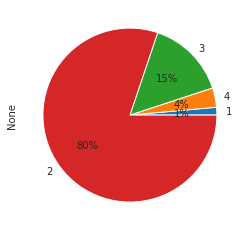

In [201]:
#df[["Weather_Condition","Severity"]].value_counts().sort_values()['Cloudy'].subplot(kind='bar')
df[["Weather_Condition","Severity"]].value_counts().sort_values()['Cloudy'].plot(kind='pie',autopct='%1.0f%%')

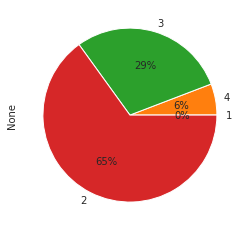

In [202]:
#df[["Weather_Condition","Severity"]].value_counts().sort_values()['Overcast'].subplot(kind='bar')
df[["Weather_Condition","Severity"]].value_counts().sort_values()['Overcast'].plot(kind='pie',autopct='%1.0f%%')

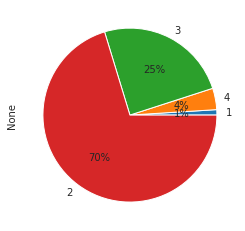

In [204]:
#df[["Weather_Condition","Severity"]].value_counts().sort_values()['Light Rain'].subplot(kind='bar')
df[["Weather_Condition","Severity"]].value_counts().sort_values()['Light Rain'].plot(kind='pie',autopct='%1.0f%%')

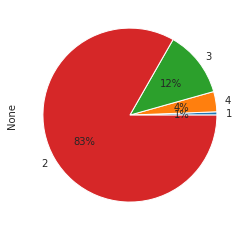

In [213]:
#df[["Weather_Condition","Severity"]].value_counts().sort_values()['Fog'].subplot(kind='bar')
df[["Weather_Condition","Severity"]].value_counts().sort_values()['Fog'].plot(kind='pie',autopct='%1.0f%%')

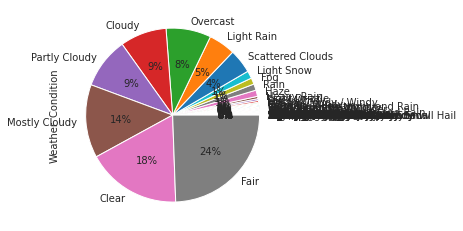

In [215]:
df["Weather_Condition"].value_counts().sort_values().plot(kind='pie',autopct='%1.0f%%')

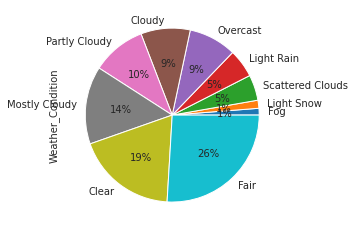

In [216]:
df["Weather_Condition"].value_counts().sort_values()[-10:].plot(kind='pie',autopct='%1.0f%%')

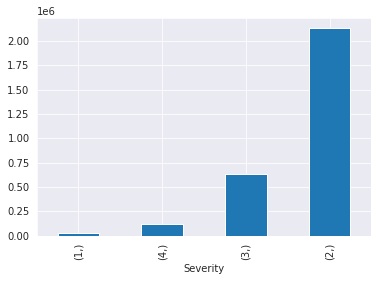

In [214]:
df[["Severity"]].value_counts().sort_values().plot(kind='bar')

### Insight 5.2: 
- Maximun occured accidents are less severe
- 78% of accidents occured in Fair, Clear and cloudy weather conditions